In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.filters import gaussian, threshold_otsu, threshold_multiotsu
from skimage.measure import label, regionprops
from skimage.morphology import remove_small_objects, binary_dilation, disk
import czifile
import skimage.io as io
from skimage import exposure
from cellpose import models
from skimage.filters import unsharp_mask
from skimage.segmentation import find_boundaries
from czifile import imread
import imageio.v2 as imageio  # or use `from imageio import imwrite` if you prefer
model = models.Cellpose(model_type='cyto3')

In [2]:
MIN_INCLUSION_SIZE = 10
MAX_INCLUSION_SIZE = 10000
COLOR_SCHEME = 'hot'

In [3]:
def display_two_images(image1, image2, title1, title2, path):
    """Display two images side-by-side with smaller title font."""
    filename = os.path.basename(path)  # Extract final part of path

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(image1, cmap='gray' if image1.ndim == 2 else None)
    axes[0].set_title(f"{filename} {title1}", fontsize=10)
    axes[0].axis('off')

    axes[1].imshow(image2, cmap='gray' if image2.ndim == 2 else None)
    axes[1].set_title(f"{filename} {title2}", fontsize=10)
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

def preprocess_green_channel(green_channel):
    """Preprocess the green channel for cell segmentation and inclusion quantification."""
    confocal_img = gaussian(green_channel, sigma=2)
    # increase image contrast
    
    # confocal_img = exposure.adjust_sigmoid(green_channel, cutoff=0.25)
    confocal_img = (confocal_img - confocal_img.min()) / (confocal_img.max() - confocal_img.min())
    
    return confocal_img

def extract_image_paths(folder):
    """Extract all image file paths from the specified folder."""
    return [os.path.join(folder, f) for f in os.listdir(folder) if os.path.isfile(os.path.join(folder, f))]

def increase_contrast(image):
    """Increase the contrast of the image."""
    p2, p98 = np.percentile(image, (2, 98))
    return exposure.rescale_intensity(image, in_range=(p2, p98))

def read_image(image_path):
    """Read the LSM image from the specified path."""
    return imread(image_path)

def extract_channels(image: np.ndarray) -> tuple[np.ndarray, np.ndarray]:
    """Extract green and red channels from the squeezed image (shape: [Z, C, H, W]).""" 
    return image[0], image[1]


def segment_cells(green_channel):
    """Segment cells in the green channel."""
    # normalize
    green_channel = (green_channel - np.min(green_channel)) / ((np.max(green_channel) - np.min(green_channel)))
    mean_intensity = np.mean(green_channel[green_channel > 0.2])
    # print("Mean Intensity: ", mean_intensity)
    green_channel_remove_inclusions = np.where(green_channel < 0.6, green_channel, mean_intensity) # dim down inclusions
    green_channel_remove_inclusions = gaussian(green_channel_remove_inclusions, sigma=5) # blur

    
    # normalize
    green_channel_remove_inclusions = (green_channel_remove_inclusions - np.min(green_channel_remove_inclusions)) / ((np.max(green_channel_remove_inclusions) - np.min(green_channel_remove_inclusions)))
    

    # add padding
    padding = 50
    green_channel_remove_inclusions = np.pad(green_channel_remove_inclusions, ((padding, padding), (padding, padding)), mode='constant', constant_values=0)
    # Detect cells in the green channel
    # keep increasing diameter until cells are detected
    diameter = 200

    while diameter < 700:

        masks, flows, styles, diams = model.eval(green_channel_remove_inclusions, diameter=diameter, channels=[0, 0])
        labeled_cells = label(masks)
        # if there are more than 0 cells
        if np.max(labeled_cells) > 0:
            # remove padding
            labeled_cells = labeled_cells[padding:-padding, padding:-padding]
            return labeled_cells
        diameter += 25
    # no cells found, throw an error
    return None

def extract_inclusions(green_channel,mask,display_graph=False):

    green_channel = (green_channel - np.min(green_channel)) / ((np.max(green_channel) - np.min(green_channel)))
    applied_mask_blurred = gaussian(green_channel, sigma=1) * mask
    applied_mask_eliminate_background = applied_mask_blurred[applied_mask_blurred > 0] # filter out 0
    
    # normalize 
    applied_mask_eliminate_background = (applied_mask_eliminate_background - np.min(applied_mask_eliminate_background)) / ((np.max(applied_mask_eliminate_background) - np.min(applied_mask_eliminate_background)))

    # calculate statistics
    mean_intensity = np.mean(applied_mask_eliminate_background)
    median_intensity = np.median(applied_mask_eliminate_background)
    q1 = np.percentile(applied_mask_eliminate_background, 25)
    q3 = np.percentile(applied_mask_eliminate_background, 75)
    
    hist, bin_edges = np.histogram(applied_mask_eliminate_background, bins='fd')
    
    applied_mask = green_channel * mask
    # 0.5 is an empirical value that seems to work well
    if q3 < 0.5 and len(bin_edges) > 20:
        # the population is skewed to the left, indicating that there are inclusions
        threshold = threshold_otsu(green_channel[mask]) + 0.1
    elif q3 >= 0.7:
        # definitely no inclusions
        threshold = 1
    else:
        # probably no inclusions, but not sure, so we set a very high threshold in case there are inclusions
        threshold = 0.999
    
    
    inclusions = applied_mask > threshold # apply the threshold

    inclusions = remove_small_objects(inclusions, min_size=MIN_INCLUSION_SIZE) # remove small objects
    inclusions = inclusions ^ remove_small_objects(inclusions, min_size=MAX_INCLUSION_SIZE) # remove large objects

    if display_graph:
        
        print("Threshold: ", threshold)
        print("Bin count", len(bin_edges))

        plt.hist(applied_mask_eliminate_background, bins='fd')  
        plt.axvline(mean_intensity, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_intensity:.2f}')
        plt.axvline(median_intensity, color='green', linestyle='dashed', linewidth=2, label=f'Median: {median_intensity:.2f}')
        plt.axvline(q1, color='blue', linestyle='dashed', linewidth=2, label=f'Q1: {q1:.2f}')
        plt.axvline(q3, color='purple', linestyle='dashed', linewidth=2, label=f'Q3: {q3:.2f}')
        plt.axvline(threshold, color='orange', linestyle='dashed', linewidth=2, label=f'Threshold: {threshold:.2f}')
        plt.legend()
        plt.title("Intensity histogram")
        plt.show()

        show_image(inclusions, title="Inclusions", cmap=COLOR_SCHEME)

    return inclusions
def generate_inclusion_image(green_channel, labeled_cells):
    
    inclusion_image = np.zeros_like(green_channel)

    for i, cell in enumerate(regionprops(labeled_cells)):
        if cell.area < 100:
            continue
        mask = labeled_cells == cell.label
        
        inclusions = extract_inclusions(green_channel, mask, display_graph=False)
        inclusion_image += inclusions
    # show_image(inclusion_image)
    return inclusion_image

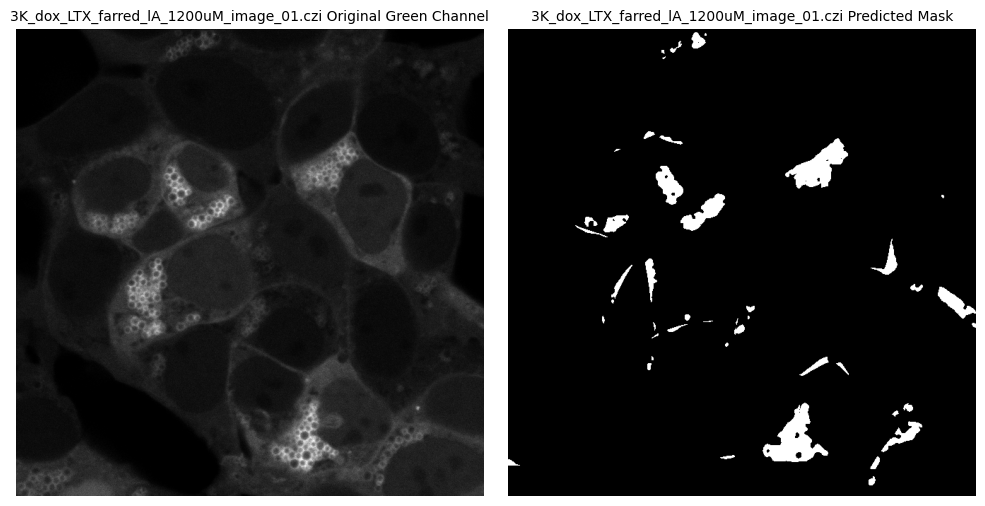

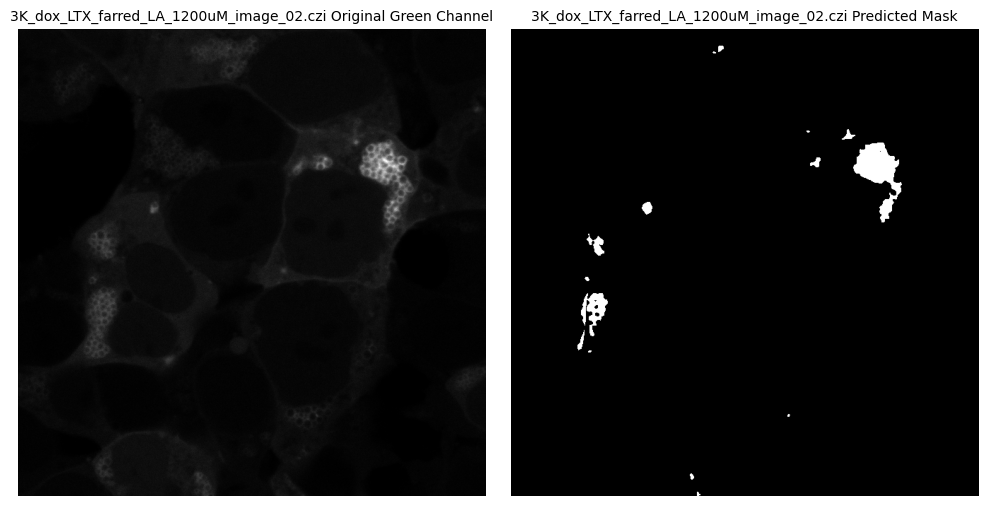

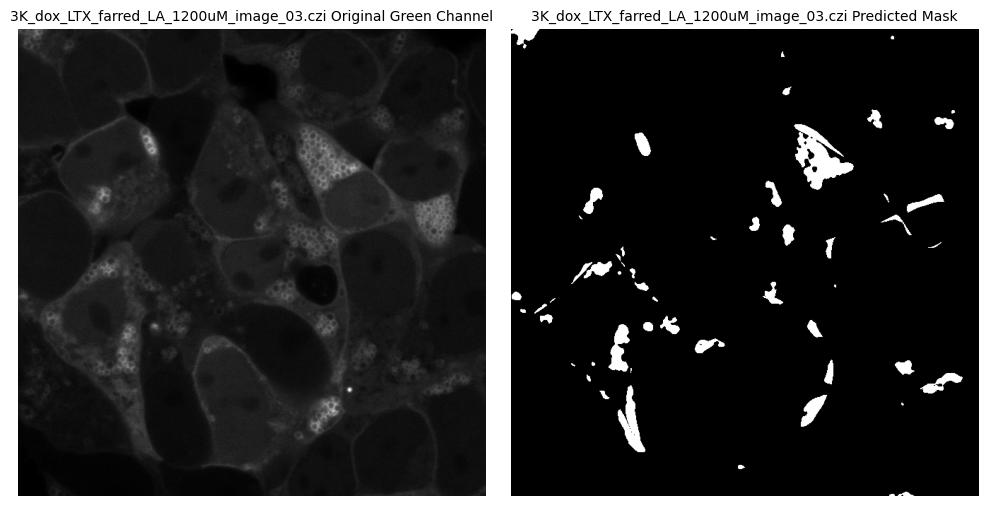

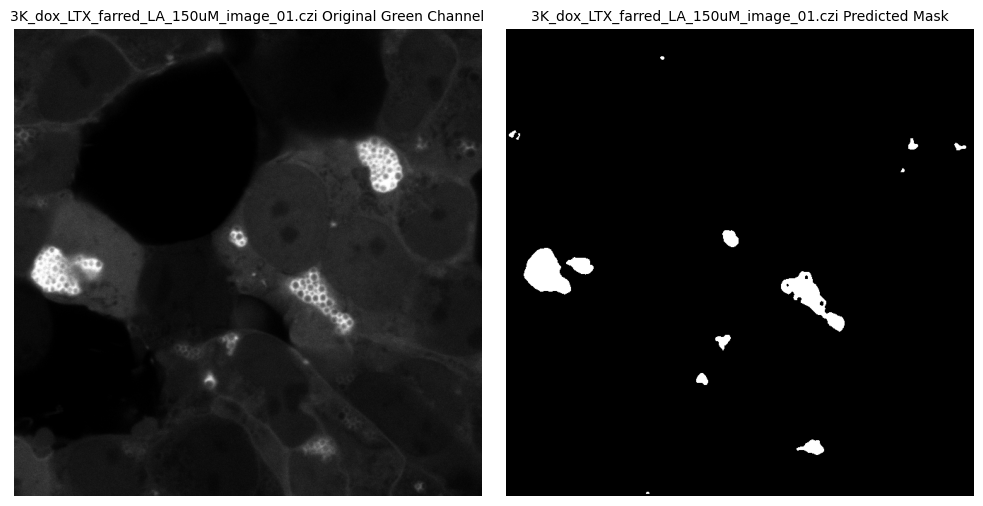

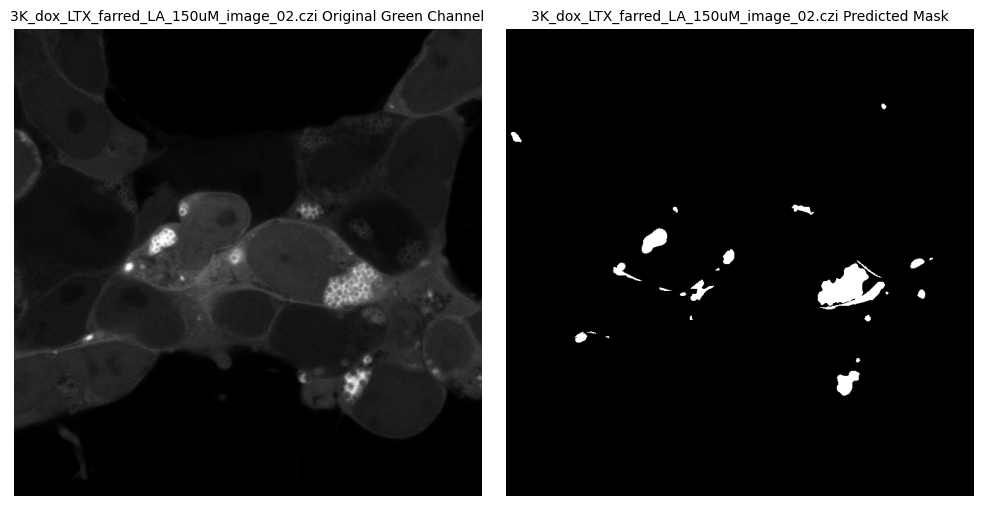

...

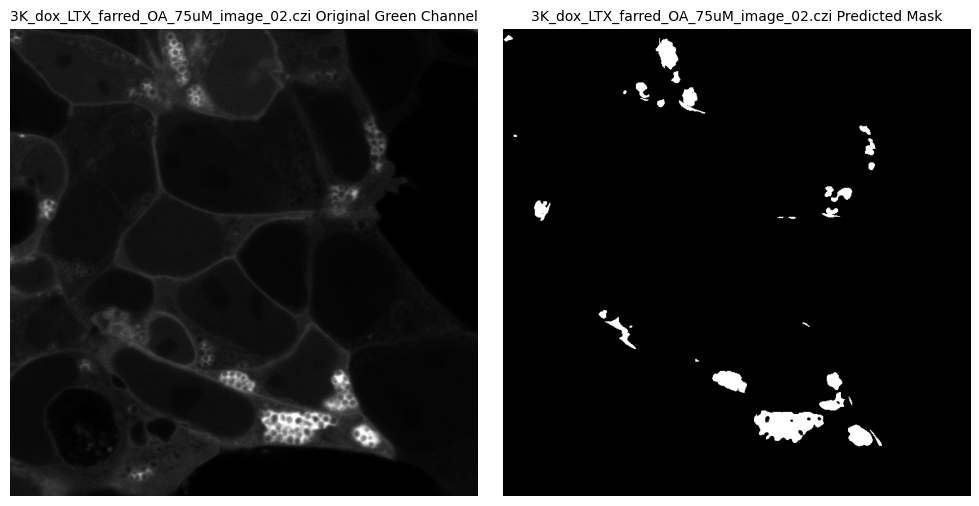

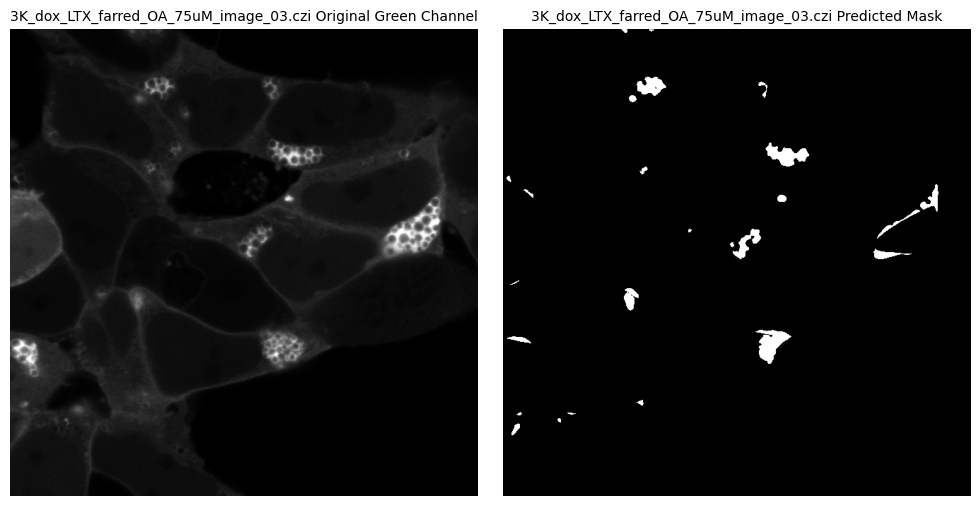

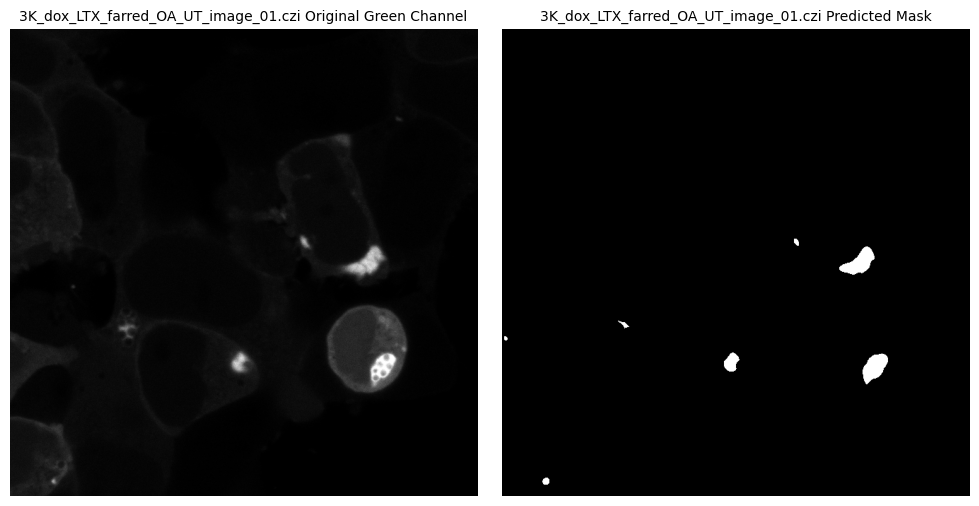

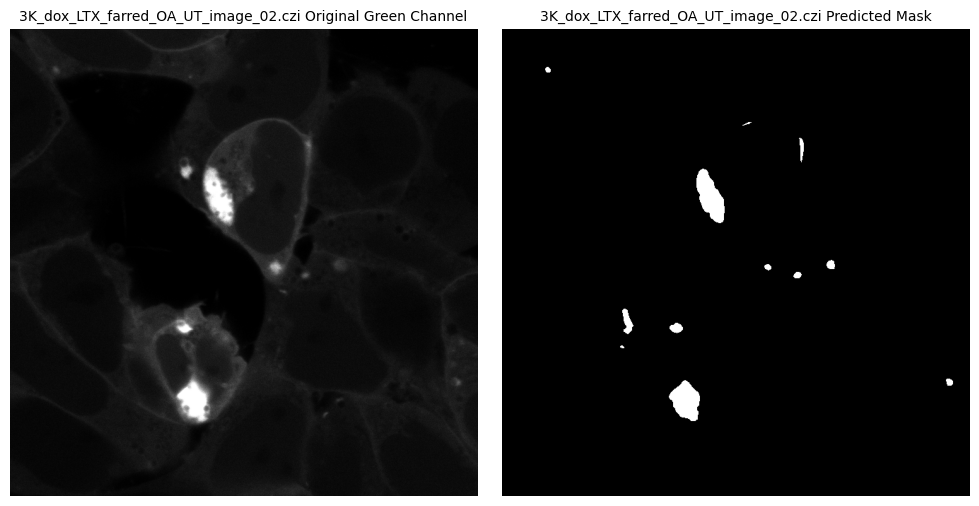

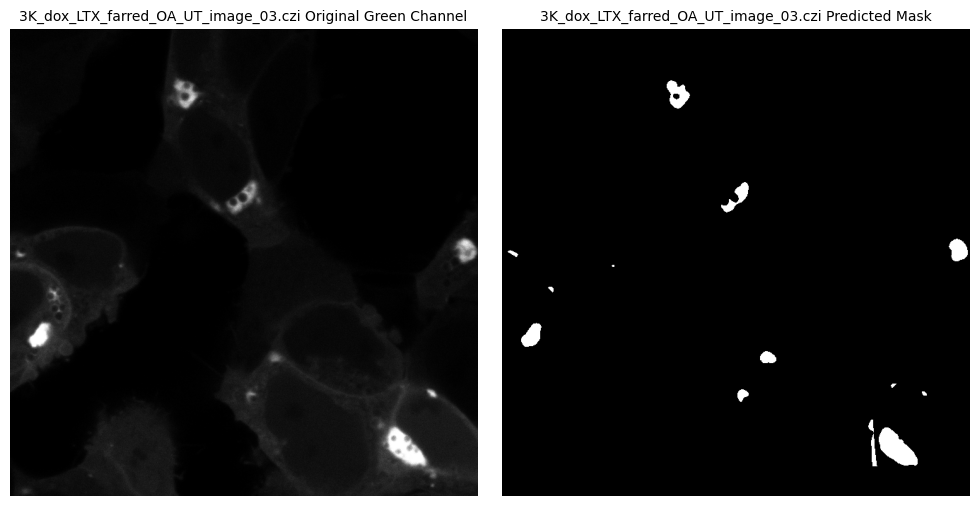

In [4]:
def main(image_folder):
    output_dir = "images/yiming_pred"
    os.makedirs(output_dir, exist_ok=True)

    images_to_analyze = extract_image_paths(image_folder)

    for path in images_to_analyze:
        image = read_image(path)
        image_squeezed = np.squeeze(image)

        red, green = extract_channels(image_squeezed)

        green_channel = preprocess_green_channel(green)
    
        labeled_cells = segment_cells(green_channel)

        inclusion_image = generate_inclusion_image(green_channel, labeled_cells)

        display_two_images(
            image1=green,
            image2=inclusion_image,
            title1="Original Green Channel",
            title2="Predicted Mask",
            path=path
        )

        # ✅ Save the predicted inclusion image
        inclusion_uint8 = inclusion_image.astype(np.uint8) * 255  # If binary/labeled
        filename = os.path.splitext(os.path.basename(path))[0]
        for prefix in ["3K_dox_LTX_farred_"]:
            if filename.startswith(prefix):
                filename = filename[len(prefix):]
                break
        save_path = os.path.join(output_dir, f"{filename}.png")
        imageio.imwrite(save_path, inclusion_uint8)

if __name__ == "__main__":
    image_folder = 'images/test_images'
    main(image_folder)